In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals

In [2]:
import tensorflow as tf

tf.test.gpu_device_name()

''

In [3]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

In [4]:
import os

In [5]:
from sklearn.metrics import confusion_matrix

## Load data ##

In [6]:
train_dir = 'data/train'
validation_dir = 'data/validation'
test_dir = 'data/test'

In [7]:
unlabelled_dir = 'data_unlabelled/unlabelled'

In [8]:
train_damaged_dir = os.path.join(train_dir, 'damaged')  # directory with our training damaged pictures
train_undamaged_dir = os.path.join(train_dir, 'undamaged')  # directory with our training undamaged pictures
validation_damaged_dir = os.path.join(validation_dir, 'damaged')  # directory with our validation damaged pictures
validation_undamaged_dir = os.path.join(validation_dir, 'undamaged')  # directory with our validation undamaged pictures
test_damaged_dir = os.path.join(test_dir, 'damaged')  # directory with our test damaged pictures
test_undamaged_dir = os.path.join(test_dir, 'undamaged')  # directory with our test undamaged pictures


In [13]:
unlabelled_damaged_dir = os.path.join(unlabelled_dir, 'damaged')  # directory with our test damaged pictures
unlabelled_undamaged_dir = os.path.join(unlabelled_dir, 'undamaged')  # directory with our test undamaged pictures


## Understand the data ##

### Let's look at how many damaged and undamaged images are in the training and validation directory: ###

In [14]:
num_damaged_tr = len(os.listdir(train_damaged_dir))
num_undamaged_tr = len(os.listdir(train_undamaged_dir))

num_damaged_val = len(os.listdir(validation_damaged_dir))
num_undamaged_val = len(os.listdir(validation_undamaged_dir))

num_damaged_ts = len(os.listdir(test_damaged_dir))
num_undamaged_ts = len(os.listdir(test_undamaged_dir))


num_damaged_u = len(os.listdir(unlabelled_damaged_dir))
num_undamaged_u = len(os.listdir(unlabelled_undamaged_dir))


total_train = num_damaged_tr + num_undamaged_tr
total_val = num_damaged_val + num_undamaged_val
total_test = num_damaged_ts + num_undamaged_ts


total_unlabelled = num_damaged_u + num_undamaged_u

In [15]:
print('total training damaged images:', num_damaged_tr)
print('total training undamaged images:', num_undamaged_tr)

print('total validation damaged images:', num_damaged_val)
print('total validation undamaged images:', num_undamaged_val)

print('total test damaged images:', num_damaged_ts)
print('total test undamaged images:', num_undamaged_ts)

print('total unlabelled damaged images:', num_damaged_u)
print('total unlabelled undamaged images:', num_undamaged_u)

print("--")
print("Total training images:", total_train)
print("Total validation images:", total_val)
print("Total test images:", total_test)

print("Total unlabelled images:", total_unlabelled)

total training damaged images: 821
total training undamaged images: 547
total validation damaged images: 273
total validation undamaged images: 183
total test damaged images: 274
total test undamaged images: 182
total unlabelled damaged images: 1120
total unlabelled undamaged images: 1226
--
Total training images: 1368
Total validation images: 456
Total test images: 456
Total unlabelled images: 2346


In [16]:
# set up variables
batch_size = 128
#epochs = 5
#IMG_HEIGHT = 150
#IMG_WIDTH = 150

# VGG19, VGG16, Inception
#IMG_HEIGHT = 224
#IMG_WIDTH = 224

# inceptionV3
#IMG_HEIGHT = 299
#IMG_WIDTH = 299


IMG_HEIGHT = 331
IMG_WIDTH = 331

## Data preparation ##

In [19]:
train_image_generator = ImageDataGenerator(rescale=1./255) # Generator for our training data
validation_image_generator = ImageDataGenerator(rescale=1./255) # Generator for our validation data
test_image_generator = ImageDataGenerator(rescale=1./255) # Generator for our test data


unlabelled_image_generator = ImageDataGenerator(rescale=1./255) # Generator for our test data

In [559]:
train_data_gen = train_image_generator.flow_from_directory(batch_size=batch_size,
                                                           directory=train_dir,
                                                           shuffle=True,
                                                           target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                           class_mode='binary')

Found 1368 images belonging to 2 classes.


In [560]:
val_data_gen = validation_image_generator.flow_from_directory(batch_size=batch_size,
                                                              directory=validation_dir,
                                                              target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                              class_mode='binary')

Found 456 images belonging to 2 classes.


In [561]:
test_data_gen = test_image_generator.flow_from_directory(batch_size=batch_size,
                                                           directory=test_dir,
                                                           shuffle=True,
                                                           target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                           class_mode='binary')

Found 456 images belonging to 2 classes.


In [20]:
unlabelled_data_gen = unlabelled_image_generator.flow_from_directory(batch_size=batch_size,
                                                           directory=unlabelled_dir,
                                                           shuffle=True,
                                                           target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                           class_mode='binary')

Found 2346 images belonging to 2 classes.


## Visualize training images ##

In [421]:
sample_training_images, _ = next(train_data_gen)

In [504]:
sample_training_images, labels = next(train_data_gen)

In [505]:
labels

array([0., 1., 0., 0., 0., 1., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 1.,
       0., 1., 0., 0., 1., 1., 1., 0., 0., 1., 0., 0., 1., 1., 1., 1., 0.,
       0., 1., 1., 0., 1., 1., 0., 1., 1., 1., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 1., 0., 1., 0., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1.,
       1., 0., 1., 0., 1., 0., 0., 1., 0., 1., 1., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 1., 0., 1., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 1., 1., 1., 1., 0., 0., 0., 0., 1., 1., 1., 0.,
       1., 1., 1., 0., 0., 1., 0., 0., 0.], dtype=float32)

In [448]:
sample_training_images, labels = next(train_data_gen)

In [453]:
labels

array([0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.,
       0., 0., 0., 0., 1., 0., 1., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       1., 1., 0., 1., 1., 1., 0., 0., 0., 1., 0., 1., 0., 0., 1., 0., 0.,
       0., 0., 1., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 0., 1., 0., 0.,
       1., 1., 0., 1., 0., 1., 0., 0., 1., 1., 1., 1., 0., 0., 1., 1., 1.,
       1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 1., 1., 1., 0., 1., 1., 0., 1., 1., 1., 0., 0., 0., 1.,
       0., 0., 0., 1., 1., 1., 1., 0., 1.], dtype=float32)

In [422]:
# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

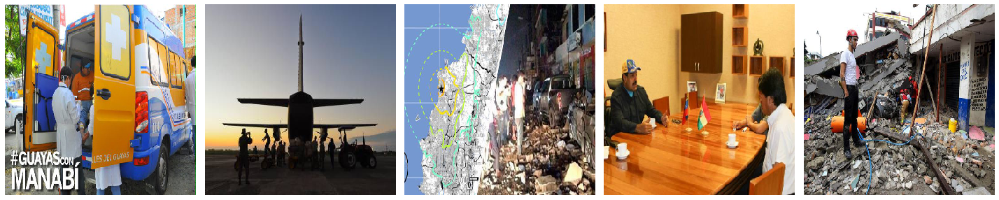

In [423]:
plotImages(sample_training_images[:5])

In [464]:
def show_batch(image_batch, label_batch):
  plt.figure(figsize=(40,40))
  for n in range(25):
      ax = plt.subplot(5,5,n+1)
      plt.imshow(image_batch[n])
      #plt.title(CLASS_NAMES[label_batch[n]==1][0].title())
      plt.title(label_batch[n])
      plt.axis('off')

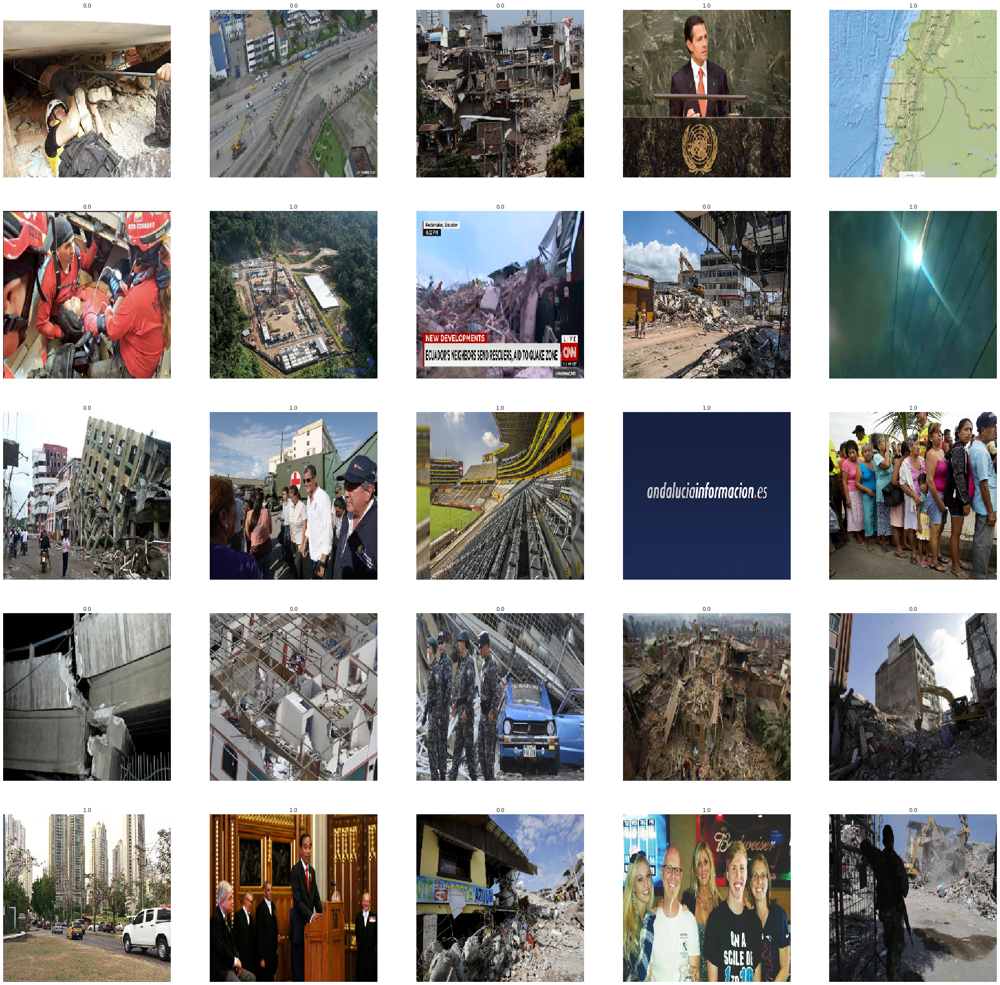

In [465]:
image_batch, label_batch = next(train_data_gen)
show_batch(image_batch, label_batch)

In [591]:
#train_data_gen.classes[:50]

In [466]:
label_batch

array([0., 0., 0., 1., 1., 0., 1., 0., 0., 1., 0., 1., 1., 1., 1., 0., 0.,
       0., 0., 0., 1., 1., 0., 1., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 0., 1., 1., 1.,
       1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 1.,
       0., 0., 0., 0., 0., 1., 0., 1., 1., 0., 0., 1., 0., 0., 1., 0., 1.,
       1., 0., 0., 0., 1., 0., 1., 0., 1., 1., 0., 0., 0., 1., 0., 0., 1.,
       0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 1.,
       1., 0., 0., 0., 1., 0., 0., 1., 0.], dtype=float32)

## NASNetLarge Pre-trained model ##

In [553]:
from keras.applications.nasnet import NASNetLarge
from keras.preprocessing import image
from keras.applications.nasnet import preprocess_input

In [554]:
base_model = NASNetLarge(weights='imagenet', include_top=False)

343613440/343610240 [==============================] - 80s 0us/step


In [555]:
# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
# let's add a fully-connected layer
x = Dense(1024, activation='relu')(x)
# and a logistic layer -- let's say we have 200 classes
predictions = Dense(2, activation='softmax')(x)

# this is the model we will train
model_NasNet = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model_NasNet.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [564]:
history_NasNet = model_NasNet.fit_generator(
    train_data_gen,
    steps_per_epoch=total_train // batch_size,
    epochs=10,
    validation_data=val_data_gen,
    validation_steps=total_val // batch_size
)

Epoch 1/10
10/10 [==============================] - 517s 52s/step - loss: 0.2961 - acc: 0.8798 - val_loss: 0.6444 - val_acc: 0.8099
Epoch 2/10
10/10 [==============================] - 499s 50s/step - loss: 0.1396 - acc: 0.9460 - val_loss: 0.9496 - val_acc: 0.7774
Epoch 3/10
10/10 [==============================] - 505s 51s/step - loss: 0.2823 - acc: 0.8957 - val_loss: 0.6391 - val_acc: 0.8018
Epoch 4/10
10/10 [==============================] - 498s 50s/step - loss: 0.1208 - acc: 0.9517 - val_loss: 1.7142 - val_acc: 0.6982
Epoch 5/10
10/10 [==============================] - 531s 53s/step - loss: 0.2590 - acc: 0.8906 - val_loss: 0.6809 - val_acc: 0.8125
Epoch 6/10
10/10 [==============================] - 503s 50s/step - loss: 0.2026 - acc: 0.9104 - val_loss: 0.4643 - val_acc: 0.8720
Epoch 7/10
10/10 [==============================] - 502s 50s/step - loss: 0.0891 - acc: 0.9683 - val_loss: 0.7761 - val_acc: 0.8232
Epoch 8/10
10/10 [==============================] - 518s 52s/step - loss: 0.

In [588]:
# Save the entire model to a HDF5 file
#model_NasNet.save('NasNet/NasNet_model.h5')


## Visualize NasNetLarge model ##

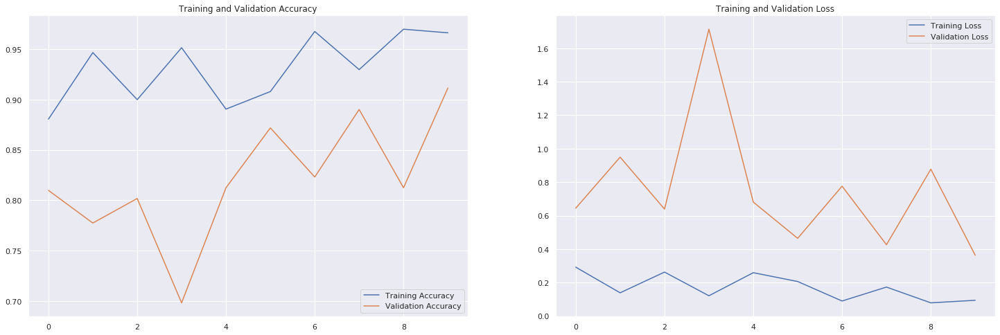

In [565]:
acc = history_NasNet.history['acc']
val_acc = history_NasNet.history['val_acc']

loss = history_NasNet.history['loss']
val_loss = history_NasNet.history['val_loss']

epochs_range = range(10)

plt.figure(figsize=(25, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [22]:
#model_NasNet = tf.keras.models.load_model('NasNet/NasNet_model_90_789.h5')

W1202 22:38:13.388207 139977147914048 deprecation.py:573] From /home/demolakstate/anaconda3/envs/dl/lib/python3.7/site-packages/tensorflow/python/util/deprecation.py:507: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with distribution=normal is deprecated and will be removed in a future version.
Instructions for updating:
`normal` is a deprecated alias for `truncated_normal`
W1202 22:38:13.395907 139977147914048 deprecation.py:506] From /home/demolakstate/anaconda3/envs/dl/lib/python3.7/site-packages/tensorflow/python/ops/init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


## Evaluation of NasNet model accuracy on unlabelled data ##

### Let's compare how the model performs on the unlabelled dataset ###

In [23]:
#test_loss, test_acc = model_NasNet.evaluate_generator(unlabelled_data_gen, verbose=0)

In [24]:
#print('\nTest accuracy:', test_acc)

In [25]:
#print('\nTest loss:', test_loss)

## Make predictions on test data ##

### Let's make predictions on some images ###

In [26]:
unlabelled_data_gen.class_indices

{'damaged': 0, 'undamaged': 1}

In [27]:
predictions_unlabelled = model_NasNet.predict_generator(unlabelled_data_gen)

In [28]:
predictions_unlabelled

array([[0.5551057 , 0.44489428],
       [0.9165553 , 0.08344477],
       [0.00200898, 0.9979911 ],
       ...,
       [0.75793445, 0.24206552],
       [0.4778688 , 0.5221312 ],
       [0.03307863, 0.96692145]], dtype=float32)

In [29]:
y_pred = np.array([np.argmax(x) for x in predictions_unlabelled])

In [32]:
y_pred[:1000]

array([0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1,

In [41]:
def _show_batch(image_batch, label_batch):
  plt.figure(figsize=(40,40))
  for n in range(25):
      ax = plt.subplot(5,5,n+1)
      plt.imshow(image_batch[n])
      #plt.title(CLASS_NAMES[label_batch[n]==1][0].title())
      plt.title(label_batch[n], fontdict={'fontsize':28})
      plt.axis('off')

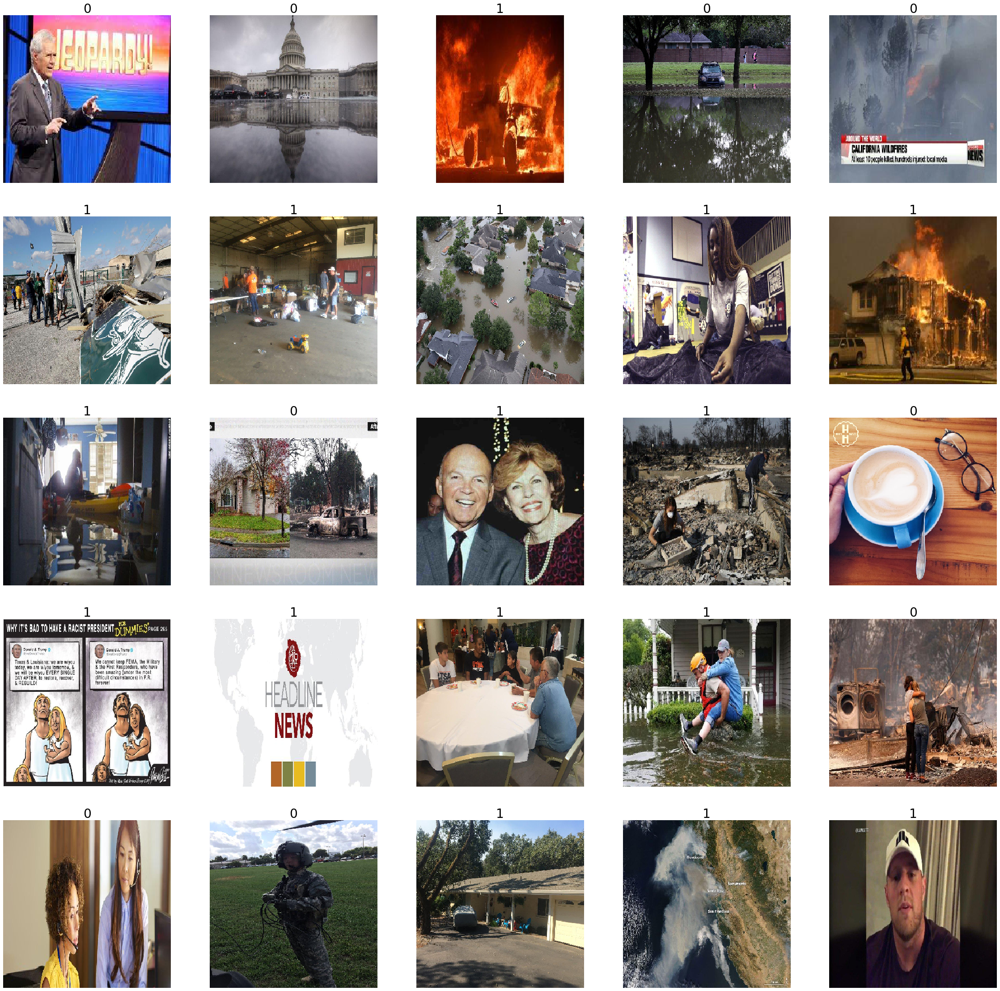

In [42]:
image_batch, label_batch = next(unlabelled_data_gen)
_show_batch(image_batch, y_pred)